## Open the notebook in Google Colab

In [ ]:
! pip install lime

In [0]:
import numpy as np
import sklearn
#import tensorflow as tf
import pandas as pd 
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression, SGDClassifier, PassiveAggressiveClassifier, Lasso
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from sklearn.model_selection import KFold, cross_val_score, StratifiedKFold
from sklearn import preprocessing
from sklearn import tree
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier, BaggingClassifier, GradientBoostingClassifier, IsolationForest, VotingClassifier   
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler, Normalizer, PolynomialFeatures
from sklearn.decomposition import PCA, KernelPCA, FastICA, SparsePCA
from sklearn.pipeline import Pipeline
from sklearn.cluster import FeatureAgglomeration
from sklearn.kernel_approximation import RBFSampler
from sklearn.metrics import f1_score
from sklearn.metrics import precision_recall_curve
from sklearn import metrics
# from lifelines import CoxPHFitter
from sklearn.cluster import KMeans
import random
import copy
import numpy as np
import pandas as pd
from sklearn import linear_model
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.datasets import load_boston
from sklearn.datasets import load_diabetes
from sklearn.metrics import r2_score
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression
# from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import time
from sklearn.datasets import fetch_california_housing

import lime
import lime.lime_tabular
import warnings
from lime import submodular_pick

In [0]:
from google.colab import drive
drive.mount('/content/gdrive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········


ValueError: ignored

## Piecewise Model 

In [0]:
class piecewise_model_new:
    def __init__(self,  K, model_type, delta,  black_box, n_components, n_clusters, project, min_clus, fit_type):
        self.K   = K
        self.model_type = model_type
        self.sequence_indices = []
        self.sequence_indices_predns = []
        self.Ys = []
        self.Xs = []
        self.Xs_transform = []
        self.cluster_index  = []
        self.normalize = normalize
        self.black_box = black_box
        self.model_list = {}
        self.n_components = n_components
        self.n_clusters   = n_clusters
        self.project      = project
        self.cluster_centers = []
        self.number_clusters = {}
        self.min_clus  = min_clus
        self.model_transform = []
        self.fit_type = fit_type
        
    
    def fit(self, X,Y):  
        self.Ys = np.sort(Y)
        self.Xs = X[np.argsort(Y)] 
        N      = self.Xs.shape[0]
        K      = self.K
        self.cluster_index = [0.0]*(N)
        self.cluster_centers = [0.0]*(K)       
        
        if(self.project == 'true'):
          self.Xs_transform = self.data_projection()
        if(self.project == 'false'):
          self.Xs_transform = self.Xs
          
        if(self.fit_type == 'optimal'): 
          self.Ys = np.sort(Y)
          self.Xs = X[np.argsort(Y)]   
#           self.Xs_transform =  X[np.argsort(Y)] 




          self.V   = np.zeros((N,K))
          self.Ind = np.zeros((N,K))


          for n in range(2,N+1):
              for k in range(1,K+1):
                  if (k==1):
                      self.V[(n-1),(0)] = self.G(0,(n)) 
                      self.Ind[(n-1),(0)] =0
                  if (k>1):
                      Value_pos = np.zeros(n-1)
                      current_min  = 1000000

                      for n_p in range(1,n):
                              Value_pos[n_p-1] = self.V[(n_p-1),(k-2)] + self.G(n_p,(n)) 

                      self.V[(n-1),(k-1)]     = np.min(Value_pos)
                      self.Ind[(n-1),(k-1)]   = np.argmin(Value_pos)
  #                     print (Value_pos)
          self.generate_model_list_extension()
        
        if (self.fit_type == 'equal_quantile'):
          self.Ys = np.sort(Y)
          self.Xs = X[np.argsort(Y)]   
          if(self.project == 'true'):
            self.Xs_transform = self.data_projection()     
          if(self.project == 'false'):  
            self.Xs_transform = self.Xs
          self.generate_model_list_extension()           
      

    def G(self, i,j):
        Ys = self.Ys
        Xs = self.Xs
        min_clus = self.min_clus
        Y  = Ys[i:j]
        X  = Xs[i:j]

        n_clusters = self.n_clusters
        if(self.model_type == 'constant'):
            Y_ls = np.sum(np.square(Y-np.mean(Y)))
            return Y_ls
        
        
        if(self.model_type == 'linear'):
            if(n_clusters == 1 or j<i+min_clus):
              reg = linear_model.Lasso(alpha=0.001,fit_intercept=True)   
              reg.fit(X, Y)
              Yp   = reg.predict(X)
              Y_ls = np.sum(np.square(Y-Yp))     
            else:
              self.data_cluster(i,j)
              Y_ls = 0
              for k in range(n_clusters):
                index_cluster = np.where(np.array(self.cluster_index[i:j])==k)[0]

                if(len(index_cluster)>=1):
#                   print (len(index_cluster))
#                   print (index_cluster)
                  reg = linear_model.Lasso(alpha=0.001, fit_intercept=True) 
#                   print(X[index_cluster].shape[0])
                  reg.fit(X[index_cluster], Y[index_cluster])
                  Yp   = reg.predict(X[index_cluster])
                  Y_ls += np.sum(np.square(Y[index_cluster]-Yp))  
            
            return Y_ls
    def data_projection(self):
        Xs = self.Xs
        pca = PCA(n_components=self.n_components)
        data = pca.fit_transform(Xs)
        plt.scatter(data[:,0], data[:,1])
#         plt.title('Scatter plot pythonspot.com')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.show()
        self.model_transform = pca

        return data
    
    def data_cluster(self,i,j):
        Xs_transform = self.Xs_transform
        X_t = Xs_transform[i:j]
        n_clusters = self.n_clusters     
        kmeans = KMeans(n_clusters=n_clusters, random_state=0)
        self.cluster_index[i:j] = kmeans.fit_predict(X_t)
#         print (self.cluster_index[i:j])
        
    def data_cluster_final(self,i,j,k):
        Xs_transform = self.Xs_transform
        X_t = Xs_transform[i:j]
        n_clusters = self.n_clusters     
        kmeans = KMeans(n_clusters=n_clusters, random_state=0)
        self.cluster_index[i:j] = kmeans.fit_predict(X_t)        
        self.cluster_centers[k] = kmeans.cluster_centers_
        
        
    def Ind_sequence(self):
        if(self.fit_type == 'optimal'):
          ind_sequence = []
          N      = self.Xs.shape[0] 
          K_rem  = self.K
          N_rem  = N
          while (N_rem>1):
              index = int(self.Ind[N_rem-1,K_rem-1])
              ind_sequence.append(index)
              N_rem = index - 1
              K_rem = K_rem - 1
          ind_sequence.reverse()
          ind_sequence.append(N-1)
          self.sequence_indices = ind_sequence

        if(self.fit_type == 'equal_quantile'):
          data_size = self.Xs.shape[0]
          K=self.K
          q = np.linspace(0,1,K+1)
#           print (q)
          self.sequence_indices= np.quantile(range(data_size), q=q).astype(int) 
  
  
        
    def generate_model_list_extension(self):
#         print (self.sequence_indices)
        min_clus = self.min_clus
        n_clusters = self.n_clusters
        self.Ind_sequence()
#         print (self.sequence_indices)
        Ys = self.Ys
        Xs = self.Xs
        ind_sequence= self.sequence_indices 
        L = len(ind_sequence)
#         print (L)
        Xb = Xs[ind_sequence]
        self.sequence_indices_predns = self.black_box.predict(Xb)
        for i in range(L-1):
            a = ind_sequence[i]
            b = ind_sequence[i+1]
            Y  = Ys[a:b]
            X  = Xs[a:b]            
            if(self.model_type == 'linear'):
                if(n_clusters == 1 or b<a+min_clus):
                  reg = linear_model.Lasso(alpha=0.01,fit_intercept=True)   
                  reg.fit(X, Y)
                  Yp   = reg.predict(X)
                  Y_ls = np.sum(np.square(Y-Yp))  
                  if(self.project == 'true'):
                    Xt   = self.model_transform.transform(X)   
                  if(self.project == 'false'):
                    Xt  = X
                  self.cluster_centers[i] = Xt.mean(0)  
                  self.model_list[i,0] = reg
                  self.number_clusters[i] = 1 
                else:                
                  self.data_cluster_final(a,b,i)
                  Y_ls = 0
                  self.number_clusters[i] = 0
                  for k in range(n_clusters):
                    index_cluster = np.where(np.array(self.cluster_index[a:b])==k)[0]

                    if(len(index_cluster)>=1):
    #                   print (len(index_cluster))
    #                   print (index_cluster)
                      reg = linear_model.Lasso(alpha=0.01,fit_intercept=True) 
    #                   print(X[index_cluster].shape[0])
                      reg.fit(X[index_cluster], Y[index_cluster])    
                      self.model_list[i,k] = reg  
                      self.number_clusters[i] += 1


        
                
                
    def predict_extension(self, x):

        
        pred_val = self.black_box.predict(x)
        model_list = self.model_list
        K=self.K
        b_predns = self.sequence_indices_predns
        
        len_bpred = len(b_predns)
        
        for j in range(len_bpred):
            if(j==0):
              if(pred_val <= b_predns[j]):
                ind_min = j
            if(j < len_bpred-1):    
                if (pred_val <= b_predns[j+1] and pred_val> b_predns[j]):
                    ind_min = j
            if(j== len_bpred- 1):
                if(pred_val > b_predns[j]):
                    ind_min = j-1
            
      
        cluster_centers = np.array(self.cluster_centers[ind_min])
        if(self.project=='true'):
          x_trans = self.model_transform.transform((x.reshape(-1,1)).T) 
        if(self.project == 'false'):
          x_trans = (x.reshape(-1,1)).T
        
        ind_clus = np.argmin(np.sum(np.square(x_trans-cluster_centers), axis=1))
        L = len(cluster_centers)
        
        
        
        
        
        if(pred_val>b_predns[ind_min]):
            if(ind_min < (len(b_predns)-1)):
                approx_pred = model_list[ind_min,ind_clus].predict(x)
#                 print ("error is:" + str((approx_pred- pred_val)**2))
                return np.maximum(np.minimum(approx_pred,b_predns[ind_min+1]), b_predns[ind_min])
            if(ind_min == len(b_predns)-1):
                approx_pred = model_list[ind_min,ind_clus].predict(x)
#                 print ("error is:" + str((approx_pred- pred_val)**2))
                return np.minimum(approx_pred,b_predns[ind_min])
            
        if(pred_val<=b_predns[ind_min]):
            if(ind_min >0):
                approx_pred = model_list[ind_min-1, ind_clus].predict(x)
#                 print ("error is:" + str((approx_pred- pred_val)**2))
                return np.maximum(np.minimum(approx_pred,b_predns[ind_min]), b_predns[ind_min-1])
            if(ind_min == 0):
                approx_pred = model_list[ind_min, ind_clus].predict(x)
#                 print ("error is:" + str((approx_pred- pred_val)**2))
                return np.maximum(approx_pred, b_predns[ind_min])               
        
     
    def model_interpretations_extension(self):
        Ys = self.Ys
        Xs = self.Xs
        ind_sequence= self.sequence_indices 
        L = len(ind_sequence)      
        ind_vector = {}
        coef_vector = {}
        for i in range(L-1):
          k = self.number_clusters[i]
          for j in range(k):
            if (self.model_type == 'linear'):
              model = self.model_list[i,j]
              coeff = np.abs(model.coef_)
              f_ind = np.argsort(-coeff)
              ind_vector[i,j]= f_ind
              coef_vector[i,j] = coeff[f_ind]
              
        
        return ind_vector, coef_vector
        
        
        
    def model_interpretations(self):
        Ys = self.Ys
        Xs = self.Xs
        ind_sequence= self.sequence_indices 
        L = len(ind_sequence)
#         print (L)
        ind_vector  = {}
#         print (Xs)
        for i in range(L-1):
            a = ind_sequence[i]
            b = ind_sequence[i+1]
            if(self.model_type == 'linear'):
                reg = linear_model.LinearRegression(fit_intercept=True)   
                reg.fit(Xs[a:b], Ys[a:b])
                coeff = np.abs(reg.coef_)
                f_ind = np.argsort(-coeff)
                ind_vector[i] = f_ind 

        return ind_vector    
      
    def compute_cluster_centers(self):
      Xs           = self.Xs
      Xs_transform = self.Xs_transform
      cluster_centers = self.cluster_centers
      n_clusters = self.n_clusters
      
      K          = self.K
      ind_sequence= self.sequence_indices 

      cluster_centers_original = {}
      index_centers_original = {}
      
      for i in range(K):
        a = ind_sequence[i]
        b = ind_sequence[i+1]
        ind_sequence_cont = range(a,b)
        Xs_transform_ab = Xs_transform[a:b]
        Xs_ab           = Xs[a:b]  
        for j in range(n_clusters):
          c = cluster_centers[i][j]
          index_min = np.argmin(np.sum(np.abs(Xs_transform_ab-c)**2, axis=1))
          
          cluster_centers_original[i,j] = Xs_ab[index_min]
          index_centers_original[i,j] = ind_sequence_cont[index_min]
      return cluster_centers_original, index_centers_original


### Import Boston Data and Fit RF regression to it

In [0]:
boston = load_boston()
rf = sklearn.ensemble.RandomForestRegressor(n_estimators=1000)
train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(boston.data, boston.target, train_size=0.80, test_size=0.20)
mean = train.mean(0)
std = train.std(0)
train = (train-mean)/std
test  = (test-mean)/std

rf.fit(train, labels_train);
print("Random Forest R^2 Score: " +str(round(r2_score(rf.predict(test),labels_test),3)))
print('Random Forest MSError', np.mean((rf.predict(test) - labels_test) ** 2))
print('MSError when predicting the mean', np.mean((labels_train.mean() - labels_test) ** 2))

Random Forest R^2 Score: 0.883
Random Forest MSError 8.21752627754907
MSError when predicting the mean 81.53606427354296


### Compute the Black Box RF's predictions on train and test

In [0]:
Y_train   = rf.predict(train)
Y_test    = rf.predict(test)

### Initialize the piecewise model: Equal quantile, K=2, N_clus=2

In [0]:
K=2
normalize = 0
delta = 1
num_clusters =2
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus, 'equal_quantile')

### Fit the piecewise model and compute the prediction on test set

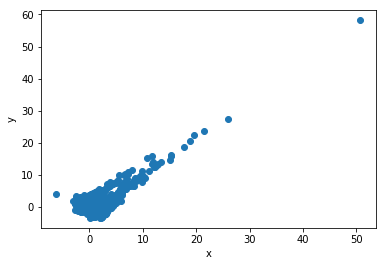

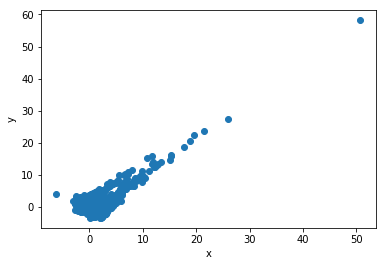

In [0]:
model.fit(train,Y_train)


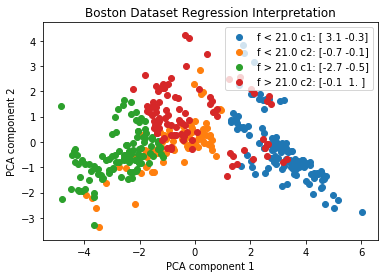

In [0]:
ind_sequence= model.sequence_indices
for i in range(K):
  a = ind_sequence[i]
  b = ind_sequence[i+1]  
  data  = model.Xs_transform[a:b] 
  for j in range(num_clusters):
        index_cluster = np.where(np.array(model.cluster_index[a:b])==j)[0]
        if(i==0):
          name = 'f < '+ str(round(model.sequence_indices_predns[1],1))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i][j],1))
        if(i==1):
          name = 'f > '+ str(round(model.sequence_indices_predns[1],1))+ ' c' + str(j+1)  + ': ' + str(np.round(model.cluster_centers[i][j],1))     
#         print (name)
        plt.scatter(data[index_cluster,0], data[index_cluster,1], label= name)
#         plt.title('Scatter plot pythonspot.com')
        plt.legend()
        plt.title("Boston Dataset Regression Interpretation")
        plt.xlabel('PCA component 1')
        plt.ylabel('PCA component 2')
        
plt.savefig('/content/gdrive/My Drive/Allerton_SPL/IEEE-SPL-LaTeX/PCA_H2_W2_EQ.pdf')

### Compute the fidelity (MSE b/w prediction of black box and the piecewise model) and MSE with actual labels

In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 5.8052646340487835
Fidelity of constant model 70.7435321581863
MSE of piecewise model 13.018914494202905
MSE of constant model 81.54380824602937


In [0]:
array = model.model_interpretations_extension()

for i in range(2):
    for j in range(2):
      print ("Risk interval " + str(i+1)) 
      print ("Cluster " + str(j+1))
      print (boston.feature_names[array[0][i,j]])
      print (array[1][i,j])


Risk interval 1
Cluster 1
['LSTAT' 'INDUS' 'NOX' 'DIS' 'TAX' 'PTRATIO' 'CRIM' 'RM' 'B' 'CHAS' 'AGE'
 'ZN' 'RAD']
[2.44452362 2.15883915 2.11157176 1.76893706 1.37628981 1.3685199
 0.48877217 0.35048698 0.32181379 0.11069555 0.02358257 0.
 0.        ]
Risk interval 1
Cluster 2
['CRIM' 'LSTAT' 'AGE' 'RAD' 'INDUS' 'NOX' 'DIS' 'CHAS' 'RM' 'B' 'PTRATIO'
 'ZN' 'TAX']
[6.79258928 1.20860065 0.71168711 0.70545481 0.69121906 0.5841442
 0.55289656 0.55164208 0.54105438 0.49466364 0.23313612 0.09985219
 0.        ]
Risk interval 2
Cluster 1
['RM' 'TAX' 'LSTAT' 'NOX' 'AGE' 'DIS' 'PTRATIO' 'ZN' 'RAD' 'CHAS' 'INDUS'
 'CRIM' 'B']
[7.36217433 2.044712   2.00321769 1.51708381 1.50039888 1.13096533
 0.74703613 0.49176321 0.29295031 0.14470307 0.05560159 0.
 0.        ]
Risk interval 2
Cluster 2
['DIS' 'LSTAT' 'RAD' 'TAX' 'NOX' 'RM' 'ZN' 'CRIM' 'AGE' 'INDUS' 'CHAS' 'B'
 'PTRATIO']
[9.70641624 7.3911942  5.61284255 4.90335435 3.4269405  2.27991604
 1.19263831 1.11024767 0.85507155 0.57025069 0.55562401 0.

### Initialize Piecewise Model: Equal Quantile, K=4, N_clus=1

In [0]:
K=4
normalize = 0
delta = 1
num_clusters =1
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus, 'equal_quantile')

### Fit the piecewise model and compute the prediction on test set

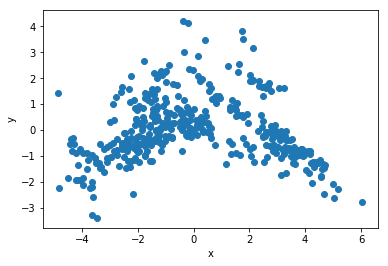

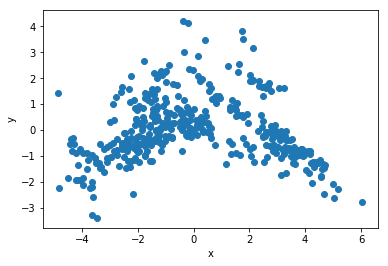

In [0]:
model.fit(train,Y_train)


In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

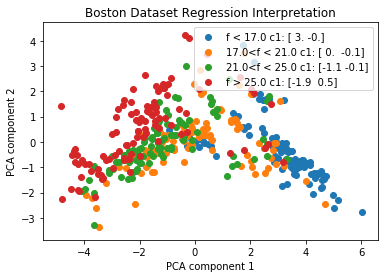

In [0]:
ind_sequence= model.sequence_indices
for i in range(K):
  a = ind_sequence[i]
  b = ind_sequence[i+1]  
  data  = model.Xs_transform[a:b] 
  for j in range(num_clusters):
        index_cluster = np.where(np.array(model.cluster_index[a:b])==j)[0]
        if(i==0):
          name = 'f < '+ str(round(model.sequence_indices_predns[i+1],0))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i],0))
        if(i==1 or i==2):
          name = str(round(model.sequence_indices_predns[i],0))+ '<f < '+ str(round(model.sequence_indices_predns[i+1],0))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i],1))
        if(i==3):
          name = 'f > '+ str(round(model.sequence_indices_predns[i],0))+ ' c' + str(j+1)  + ': ' + str(np.round(model.cluster_centers[i],1))     
          
#         print (name)
        plt.scatter(data[index_cluster,0], data[index_cluster,1], label= name)
#         plt.title('Scatter plot pythonspot.com')
        plt.legend()
        plt.title("Boston Dataset Regression Interpretation")
        plt.xlabel('PCA component 1')
        plt.ylabel('PCA component 2')
        
plt.savefig('/content/gdrive/My Drive/Allerton_SPL/IEEE-SPL-LaTeX/PCA_H4_W1_EQ.pdf')

### Compute the fidelity (MSE b/w prediction of black box and the piecewise model) and MSE with actual labels

In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 5.766543642230812
Fidelity of constant model 70.7435321581863
MSE of piecewise model 15.108783567385103
MSE of constant model 81.54380824602937


### Initialize Piecewise Model: Optimal, K=4, N_clus=1

In [0]:
K=4
normalize = 0
delta = 1
num_clusters =1
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus, 'optimal')

### Fit the piecewise model and compute the prediction on test set

In [0]:
model.fit(train,Y_train)

In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

In [0]:
model.sequence_indices

[0, 129, 309, 370, 403]

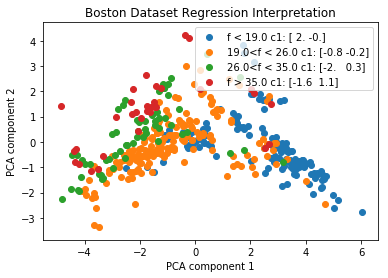

In [0]:
ind_sequence= model.sequence_indices
for i in range(K):
  a = ind_sequence[i]
  b = ind_sequence[i+1]  
  data  = model.Xs_transform[a:b] 
  for j in range(num_clusters):
        index_cluster = np.where(np.array(model.cluster_index[a:b])==j)[0]
        if(i==0):
          name = 'f < '+ str(round(model.sequence_indices_predns[i+1],0))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i],0))
        if(i==1 or i==2):
          name = str(round(model.sequence_indices_predns[i],0))+ '<f < '+ str(round(model.sequence_indices_predns[i+1],0))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i],1))
        if(i==3):
          name = 'f > '+ str(round(model.sequence_indices_predns[i],0))+ ' c' + str(j+1)  + ': ' + str(np.round(model.cluster_centers[i],1))     
          
#         print (name)
        plt.scatter(data[index_cluster,0], data[index_cluster,1], label= name)
#         plt.title('Scatter plot pythonspot.com')
        plt.legend()
        plt.title("Boston Dataset Regression Interpretation")
        plt.xlabel('PCA component 1')
        plt.ylabel('PCA component 2')
        
plt.savefig('/content/gdrive/My Drive/Allerton_SPL/IEEE-SPL-LaTeX/PCA_H4_W1_OP.pdf')
#         plt.show()

In [0]:
array = model.model_interpretations_extension()

for i in range(4):
    for j in range(1):
      print ("Risk interval " + str(i+1)) 
      print ("Cluster " + str(j+1))
      print (boston.feature_names[array[0][i,j]])
      print (array[1][i,j])

Risk interval 1
Cluster 1
['LSTAT' 'TAX' 'NOX' 'PTRATIO' 'ZN' 'RAD' 'INDUS' 'CRIM' 'CHAS' 'DIS' 'B'
 'RM' 'AGE']
[1.59268804 1.4582161  1.36907134 1.04774699 0.78621723 0.73153231
 0.68723259 0.63085954 0.41456771 0.31110258 0.18166301 0.13720634
 0.05048152]
Risk interval 2
Cluster 1
['LSTAT' 'RM' 'RAD' 'TAX' 'DIS' 'AGE' 'PTRATIO' 'CRIM' 'B' 'CHAS' 'ZN'
 'INDUS' 'NOX']
[1.42657899 1.38156222 0.93933739 0.71870521 0.63069079 0.61933161
 0.57700587 0.40438823 0.27918809 0.22043428 0.17105805 0.11856637
 0.0828687 ]
Risk interval 3
Cluster 1
['RAD' 'LSTAT' 'TAX' 'INDUS' 'PTRATIO' 'RM' 'DIS' 'ZN' 'AGE' 'NOX' 'CHAS'
 'CRIM' 'B']
[2.77547019 2.24553111 1.57002494 1.39294164 0.99782201 0.94566288
 0.93541811 0.62236952 0.57178142 0.15606918 0.10604071 0.
 0.        ]
Risk interval 4
Cluster 1
['RAD' 'CRIM' 'NOX' 'TAX' 'PTRATIO' 'DIS' 'LSTAT' 'RM' 'INDUS' 'AGE' 'ZN'
 'CHAS' 'B']
[7.74257621 6.61255745 4.69710771 3.04296157 3.02524473 2.71556892
 2.65934593 2.51171163 2.48394979 1.34670945 0.0

In [0]:
boston = load_boston()
boston.feature_names

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], dtype='<U7')

### Compute the fidelity (MSE b/w prediction of black box and the piecewise model) and MSE with actual labels




In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 3.4013647420728295
Fidelity of constant model 70.7435321581863
MSE of piecewise model 10.050104704895203
MSE of constant model 81.54380824602937


In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 3.4013647420728295
Fidelity of constant model 70.7435321581863
MSE of piecewise model 10.050104704895203
MSE of constant model 81.54380824602937


### Initialize Piecewise Model: Optimal, K=1, N_clus=4

In [0]:
K=1
normalize = 0
delta = 1
num_clusters =4
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus, 'equal_quantile')

### Fit the piecewise model and compute the prediction on test set

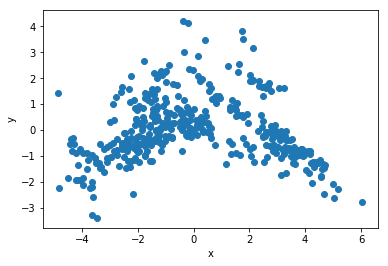

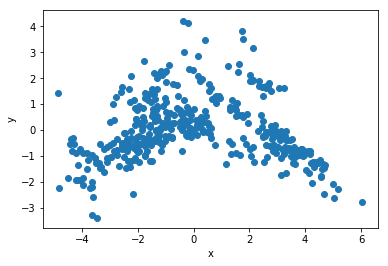

In [0]:
model.fit(train,Y_train)

In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

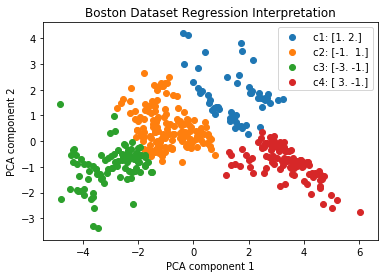

In [0]:
ind_sequence= model.sequence_indices
for i in range(1):
  a = ind_sequence[i]
  b = ind_sequence[i+1]  
  data  = model.Xs_transform[a:b] 
  for j in range(4):
        index_cluster = np.where(np.array(model.cluster_index[a:b])==j)[0]
        if(i==0):
          name = ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i][j],0))
#         if(i==1 or i==2):
#           name = str(round(model.sequence_indices_predns[i],0))+ '<f < '+ str(round(model.sequence_indices_predns[i+1],0))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i],1))
#         if(i==3):
#           name = 'f > '+ str(round(model.sequence_indices_predns[i],0))+ ' c' + str(j+1)  + ': ' + str(np.round(model.cluster_centers[i],1))     
          
#         print (name)
        plt.scatter(data[index_cluster,0], data[index_cluster,1], label= name)
#         plt.title('Scatter plot pythonspot.com')
        plt.legend()
        plt.title("Boston Dataset Regression Interpretation")
        plt.xlabel('PCA component 1')
        plt.ylabel('PCA component 2')
        
plt.savefig('/content/gdrive/My Drive/Allerton_SPL/IEEE-SPL-LaTeX/PCA_H1_W4_OP.pdf')

### Compute the fidelity (MSE b/w prediction of black box and the piecewise model) and MSE with actual labels



In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 8.797475981177117
Fidelity of constant model 70.7435321581863
MSE of piecewise model 11.325748373706428
MSE of constant model 81.54380824602937


### Initialize Piecewise Model: Optimal, K=2, N_clus=2

In [0]:
K=2
normalize = 0
delta = 1
num_clusters =2
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus, 'optimal')

### Fit the piecewise model and compute the prediction on test set

In [0]:
model.fit(train,Y_train)

In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

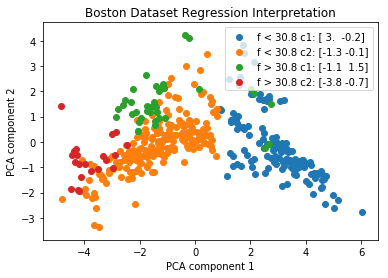

In [0]:
ind_sequence= model.sequence_indices
for i in range(K):
  a = ind_sequence[i]
  b = ind_sequence[i+1]  
  data  = model.Xs_transform[a:b] 
  for j in range(num_clusters):
        index_cluster = np.where(np.array(model.cluster_index[a:b])==j)[0]
        if(i==0):
          name = 'f < '+ str(round(model.sequence_indices_predns[1],1))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i][j],1))
        if(i==1):
          name = 'f > '+ str(round(model.sequence_indices_predns[1],1))+ ' c' + str(j+1)  + ': ' + str(np.round(model.cluster_centers[i][j],1))     
#         print (name)
        plt.scatter(data[index_cluster,0], data[index_cluster,1], label= name)
#         plt.title('Scatter plot pythonspot.com')
        plt.legend()
        plt.title("Boston Dataset Regression Interpretation")
        plt.xlabel('PCA component 1')
        plt.ylabel('PCA component 2')
        
plt.savefig('/content/gdrive/My Drive/Allerton_SPL/IEEE-SPL-LaTeX/PCA_H2_W2_OP.pdf')

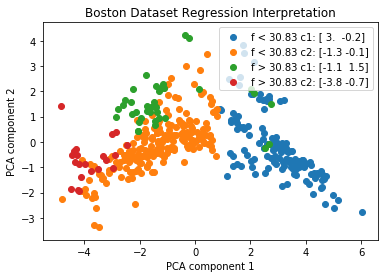

In [0]:
ind_sequence= model.sequence_indices
for i in range(K):
  a = ind_sequence[i]
  b = ind_sequence[i+1]  
  data  = model.Xs_transform[a:b] 
  for j in range(num_clusters):
        index_cluster = np.where(np.array(model.cluster_index[a:b])==j)[0]
        if(i==0):
          name = 'f < '+ str(round(model.sequence_indices_predns[1],2))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i][j],1))
        if(i==1):
          name = 'f > '+ str(round(model.sequence_indices_predns[1],2))+ ' c' + str(j+1)  + ': ' + str(np.round(model.cluster_centers[i][j],1))     
#         print (name)
        plt.scatter(data[index_cluster,0], data[index_cluster,1], label= name)
#         plt.title('Scatter plot pythonspot.com')
        plt.legend()
        plt.title("Boston Dataset Regression Interpretation")
        plt.xlabel('PCA component 1')
        plt.ylabel('PCA component 2')
        

In [0]:
model.sequence_indices_predns

array([ 5.756 , 30.8338, 48.9792])

### Compute the fidelity (MSE b/w prediction of black box and the piecewise model) and MSE with actual labels

In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 6.390203618837429
Fidelity of constant model 70.7435321581863
MSE of piecewise model 12.40914416855363
MSE of constant model 81.54380824602937


In [0]:
a,b = model.compute_cluster_centers()

In [0]:
b

{(0, 0): 56, (0, 1): 277, (1, 0): 380, (1, 1): 345}

### Compute the model interpretations

In [0]:
array = model.model_interpretations_extension()
print (array)

In [0]:
array = model.model_interpretations_extension()

for i in range(2):
    for j in range(2):
      print ("Risk interval " + str(i+1)) 
      print ("Cluster " + str(j+1))
      print (boston.feature_names[array[0][i,j]])
      print (array[1][i,j])


Risk interval 1
Cluster 1
['LSTAT' 'NOX' 'TAX' 'INDUS' 'PTRATIO' 'RAD' 'CRIM' 'AGE' 'B' 'CHAS' 'RM'
 'ZN' 'DIS']
[3.0487377  1.70843468 1.48186111 1.20123471 1.07991622 0.71406273
 0.64399118 0.54935047 0.48510259 0.45619702 0.02297243 0.
 0.        ]
Risk interval 1
Cluster 2
['RM' 'LSTAT' 'TAX' 'RAD' 'DIS' 'AGE' 'PTRATIO' 'ZN' 'B' 'CHAS' 'CRIM'
 'INDUS' 'NOX']
[3.17920482 1.45397815 1.32488447 1.22607004 1.20300321 0.97436445
 0.83742667 0.55514717 0.51741632 0.36127835 0.         0.
 0.        ]
Risk interval 2
Cluster 1
['CRIM' 'LSTAT' 'DIS' 'TAX' 'RM' 'RAD' 'AGE' 'INDUS' 'B' 'PTRATIO' 'ZN'
 'CHAS' 'NOX']
[18.83817505  9.17707401  5.0589352   4.3125862   3.06872791  2.73478436
  2.4563234   1.97500036  1.55066873  0.85646569  0.75276098  0.4698802
  0.44411075]
Risk interval 2
Cluster 2
['RM' 'LSTAT' 'DIS' 'ZN' 'RAD' 'INDUS' 'CHAS' 'PTRATIO' 'AGE' 'NOX' 'CRIM'
 'TAX' 'B']
[7.56789052 7.00667965 3.02323754 0.72656087 0.58673622 0.39656806
 0.38516379 0.31868609 0.27389161 0.20385983

### Compute Linear Model and its MSE and Fidelity

In [0]:
model_linear = linear_model.LinearRegression(fit_intercept=True) 
model_linear.fit(train, Y_train)
print("Linear model R^2 Score: " +str(round(r2_score(model_linear.predict(test),Y_test),3)))
print ("Fidelity of the linear model is : " + str(np.mean((model_linear.predict(test)-Y_test)**2)))
print("Linear model R^2 Score: " +str(round(r2_score(model_linear.predict(test),labels_test),3)))
print ("MSE of linear model is : " + str(np.mean((model_linear.predict(test)-labels_test)**2)))

Linear model R^2 Score: 0.699
Fidelity of the linear model is : 15.359676874120586
Linear model R^2 Score: 0.591
MSE of linear model is : 20.903547520798696


In [0]:
model_linear = linear_model.LinearRegression(fit_intercept=True) 
model_linear.fit(train, labels_train)
print("Linear model R^2 Score: " +str(round(r2_score(model_linear.predict(test),Y_test),3)))
print ("Fidelity of the linear model is : " + str(np.mean((model_linear.predict(test)-Y_test)**2)))
print("Linear model R^2 Score: " +str(round(r2_score(model_linear.predict(test),labels_test),3)))
print ("MSE of linear model is : " + str(np.mean((model_linear.predict(test)-labels_test)**2)))

Linear model R^2 Score: 0.688
Fidelity of the linear model is : 16.791887550651587
Linear model R^2 Score: 0.595
MSE of linear model is : 21.785255658265203


### Compute the Regression Tree based model and its MSE and Fidelity

In [0]:
model_tree = tree.DecisionTreeRegressor(max_leaf_nodes=4)
model_tree = model_tree.fit(train, Y_train)
print("Tree model  R^2 Score: " +str(round(r2_score(model_tree.predict(test),Y_test),3)))
print ("Fidelity of the regression tree model is : " + str(np.mean((model_tree.predict(test)-Y_test)**2)))
print("Tree model R^2 Score: " +str(round(r2_score(model_tree.predict(test),labels_test),3)))
print ("MSE of regression tree model is : " + str(np.mean((model_tree.predict(test)-labels_test)**2)))

Tree model  R^2 Score: 0.683
Fidelity of the regression tree model is : 18.864629552145352
Tree model R^2 Score: 0.512
MSE of regression tree model is : 29.01476180928667


In [0]:
model_tree = tree.DecisionTreeRegressor(max_leaf_nodes=4)
model_tree = model_tree.fit(train, labels_train)
print("Tree model  R^2 Score: " +str(round(r2_score(model_tree.predict(test),Y_test),3)))
print ("Fidelity of the regression tree model is : " + str(np.mean((model_tree.predict(test)-Y_test)**2)))
print("Tree model R^2 Score: " +str(round(r2_score(model_tree.predict(test),labels_test),3)))
print ("MSE of regression tree model is : " + str(np.mean((model_tree.predict(test)-labels_test)**2)))

Tree model  R^2 Score: 0.621
Fidelity of the regression tree model is : 21.170683893206654
Tree model R^2 Score: 0.334
MSE of regression tree model is : 37.23433948534348


## Sample DataPoints and Comparison with Submodular Pick

In [0]:
def coverage_val(A):
  m = A.shape[0]
  n = A.shape[1]
  cur_av = 0
  for i in range(m):
    cur_min = 100000
    for j in range(m):
      if(j !=  i):
        cur_val = np.linalg.norm(A[i]-A[j])
        if(cur_val<cur_min):
          cur_min = cur_val 
    cur_av += cur_min
  cur_av = cur_av/m
  return cur_av

## Initialize LIME Explainer Object

In [0]:
categorical_features = np.argwhere(np.array([len(set(boston.data[:,x])) for x in range(boston.data.shape[1])]) <= 10).flatten()
explainer = lime.lime_tabular.LimeTabularExplainer(train, feature_names=boston.feature_names, class_names=['price'], categorical_features=categorical_features, verbose=False, mode='regression',discretize_continuous=False)

In [0]:

np.random.seed(1)
set_indices =list(model.compute_cluster_centers()[1].values())
Beta = np.zeros((4,13))
Data = np.zeros((4,2))
Data_r = np.zeros((4,13))
Predict_val = np.zeros((4,1))
k= 0
for i in set_indices:
  exp = explainer.explain_instance(model.Xs[i], rf.predict, num_features=13)
  exp.show_in_notebook(show_all=False)
  index, coeff = list(zip(*exp.local_exp[1]))
  Beta[k,index] = coeff
  data_point = model.model_transform.transform(model.Xs[i].reshape(-1,1).T)
  Data[k] = data_point
  Data_r[k] = model.Xs[i]
  Predict_val[k] = rf.predict(model.Xs[i].reshape(-1,1).T)

  k+=1
  
Coverage_data = coverage_val(Data)
Coverage_predict = coverage_val(Predict_val)
Coverage_beta = coverage_val(Beta)
Coverage_data_r = coverage_val(Data_r)
print (Coverage_data)
print (Coverage_predict)
print (Coverage_beta)
print (Coverage_data_r)

1.8249076263438644
8.696124999999952
0.8155328648075626
3.808822228066096


In [0]:
np.random.seed(1)
set_indices =list(model.compute_cluster_centers()[1].values())
Beta = np.zeros((4,13))
Data = np.zeros((4,2))
Data_r = np.zeros((4,13))
Predict_val = np.zeros((4,1))
k= 0
for i in set_indices:
  exp = explainer.explain_instance(model.Xs[i], rf.predict, num_features=5)
  exp.show_in_notebook(show_all=False)
  index, coeff = list(zip(*exp.local_exp[1]))
  Beta[k,index] = coeff
  data_point = model.model_transform.transform(model.Xs[i].reshape(-1,1).T)
  Data[k] = data_point
  Data_r[k] = model.Xs[i]
  Predict_val[k] = rf.predict(model.Xs[i].reshape(-1,1).T)

  k+=1
  
Coverage_data = coverage_val(Data)
Coverage_predict = coverage_val(Predict_val)
Coverage_beta = coverage_val(Beta)
Coverage_data_r = coverage_val(Data_r)
print (Coverage_data)
print (Coverage_predict)
print (Coverage_beta)
print (Coverage_data_r)

1.8249076263438644
8.696124999999952
0.6751226431564727
3.808822228066096


In [0]:
Coverage_data=0
Coverage_predict = 0
Coverage_beta = 0
Coverage_data_r = 0
for t in range(10):
  set_indices =list(model.compute_cluster_centers()[1].values())
  Beta = np.zeros((4,13))
  Data = np.zeros((4,2))
  Data_r = np.zeros((4,13))
  Predict_val = np.zeros((4,1))
  k= 0
  for i in set_indices:
    exp = explainer.explain_instance(model.Xs[i], rf.predict, num_features=13)
#     exp.show_in_notebook(show_all=False)
    index, coeff = list(zip(*exp.local_exp[1]))
    Beta[k,index] = coeff
    data_point = model.model_transform.transform(model.Xs[i].reshape(-1,1).T)
    Data[k] = data_point
    Data_r[k] = model.Xs[i]
    Predict_val[k] = rf.predict(model.Xs[i].reshape(-1,1).T)

    k+=1

  Coverage_data += coverage_val(Data)
  Coverage_predict += coverage_val(Predict_val)
  Coverage_beta += coverage_val(Beta)
  Coverage_data_r += coverage_val(Data_r)
print (Coverage_data/10)
print (Coverage_predict/10)
print (Coverage_beta/10)
print (Coverage_data_r/10)

1.8249076263438648
8.696124999999952
0.6543286568821026
3.808822228066096


##Submodular Pick

In [0]:
np.random.seed(1)
sp_obj = submodular_pick.SubmodularPick(explainer, train, rf.predict, sample_size=10, num_features=13, num_exps_desired=4, method='full')

In [0]:
Coverage_data=0
Coverage_predict = 0
Coverage_beta = 0
Coverage_data_r = 0
for t in range(10):
  set_indices =sp_obj.V
  Beta = np.zeros((4,13))
  Data = np.zeros((4,2))
  Data_r = np.zeros((4,13))
  Predict_val = np.zeros((4,1))
  k= 0
  for i in set_indices:
    exp = explainer.explain_instance(train[i], rf.predict, num_features=13)
#     exp.show_in_notebook(show_all=False)
    index, coeff = list(zip(*exp.local_exp[1]))
    Beta[k,index] = coeff
    data_point = model.model_transform.transform(train[i].reshape(-1,1).T)
    Data[k] = data_point
    Data_r[k] = model.Xs[i]
    Predict_val[k] = rf.predict(model.Xs[i].reshape(-1,1).T)

    k+=1

  Coverage_data += coverage_val(Data)
  Coverage_predict += coverage_val(Predict_val)
  Coverage_beta += coverage_val(Beta)
  Coverage_data_r += coverage_val(Data_r)
print (Coverage_data/10)
print (Coverage_predict/10)
print (Coverage_beta/10)
print (Coverage_data_r/10)

1.5948622462494093
4.385599999999948
0.6258435716683379
3.2096299784572153


In [0]:
Coverage_data=0
Coverage_predict = 0
Coverage_beta = 0
Coverage_data_r = 0
for t in range(10):
  set_indices =sp_obj.V
  Beta = np.zeros((4,13))
  Data = np.zeros((4,2))
  Data_r = np.zeros((4,13))
  Predict_val = np.zeros((4,1))
  k= 0
  for i in set_indices:
    exp = explainer.explain_instance(train[i], rf.predict, num_features=13)
#     exp.show_in_notebook(show_all=False)
    index, coeff = list(zip(*exp.local_exp[1]))
    Beta[k,index] = coeff
    data_point = model.model_transform.transform(train[i].reshape(-1,1).T)
    Data[k] = data_point
    Data_r[k] = model.Xs[i]
    Predict_val[k] = rf.predict(model.Xs[i].reshape(-1,1).T)

    k+=1

  Coverage_data += coverage_val(Data)
  Coverage_predict += coverage_val(Predict_val)
  Coverage_beta += coverage_val(Beta)
  Coverage_data_r += coverage_val(Data_r)
print (Coverage_data/10)
print (Coverage_predict/10)
print (Coverage_beta/10)
print (Coverage_data_r/10)

1.5948622462494093
4.385599999999948
0.6359039948838381
3.2096299784572153


## Random Choice

In [0]:
Coverage_data=0
Coverage_predict = 0
Coverage_beta = 0
Coverage_data_r = 0
for t in range(10):
  set_indices =np.random.choice(range(402), 4, replace=False)
  Beta = np.zeros((4,13))
  Data = np.zeros((4,2))
  Data_r = np.zeros((4,13))
  Predict_val = np.zeros((4,1))
  k= 0
  for i in set_indices:
    exp = explainer.explain_instance(train[i], rf.predict, num_features=13)
#     exp.show_in_notebook(show_all=False)
    index, coeff = list(zip(*exp.local_exp[1]))
    Beta[k,index] = coeff
    data_point = model.model_transform.transform(train[i].reshape(-1,1).T)
    Data[k] = data_point
    Data_r[k] = model.Xs[i]
    Predict_val[k] = rf.predict(train[i].reshape(-1,1).T)

    k+=1

  Coverage_data += coverage_val(Data)
  Coverage_predict += coverage_val(Predict_val)
  Coverage_beta += coverage_val(Beta)
  Coverage_data_r += coverage_val(Data_r)
  
print (Coverage_data/10)
print (Coverage_predict/10)
print (Coverage_beta/10)
print (Coverage_data_r/10)

1.430626944703635
3.872977499999982
0.6005924186744923
3.7530368494294186


## **Synthetic Data Example**

In [0]:
def non_linear_example(x):
  return x[0]**2 + x[1]**2 +2*x[1]*x[0]

In [0]:
mean = np.zeros(2)
cov = np.eye(2)
data= np.random.multivariate_normal(mean, cov, 1000)
target = np.zeros(1000)

for i in range(data.shape[0]):
  target[i] = non_linear_example(data[i])

## Fit a RF regression to the synthetic data

In [0]:

rf = sklearn.ensemble.RandomForestRegressor(n_estimators=1000)
train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(data, target, train_size=0.80, test_size=0.20)

rf.fit(train, labels_train);
print("Random Forest R^2 Score: " +str(round(r2_score(rf.predict(test),labels_test),3)))
print('Random Forest MSError', np.mean((rf.predict(test) - labels_test) ** 2))
print('MSError when predicting the mean', np.mean((labels_train.mean() - labels_test) ** 2))

Random Forest R^2 Score: 0.977
Random Forest MSError 0.10676494227096558
MSError when predicting the mean 5.435921897889823


In [0]:
rf = sklearn.ensemble.RandomForestRegressor(n_estimators=1000)
train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(data, target, train_size=0.80, test_size=0.20)

rf.fit(train, labels_train);
print("Random Forest R^2 Score: " +str(round(r2_score(rf.predict(test),labels_test),3)))
print('Random Forest MSError', np.mean((rf.predict(test) - labels_test) ** 2))
print('MSError when predicting the mean', np.mean((labels_train.mean() - labels_test) ** 2))

Random Forest R^2 Score: 0.936
Random Forest MSError 0.37016691397557905
MSError when predicting the mean 7.5295633353486355


## Prediction based on RF model 

In [0]:
Y_train  = rf.predict(train)
Y_test   = rf.predict(test)

## Initialize piecewise model: Equal Quantile, K=2, N_clus=2

In [0]:
K=2
normalize = 0
delta = 1
num_clusters =2
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'false', min_clus, 'equal_quantile')

## Fit a piecewise model

In [0]:
model.fit(train,Y_train)

In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

## Piecewise model (Fidelity and MSE)


In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 0.18744642667494713
Fidelity of constant model 4.613383845318623
MSE of piecewise model 0.11188896188329084
MSE of constant model 5.437507789315265


In [0]:
model.compute_cluster_centers()

({(0, 0): array([ 0.58433651, -0.58952375]),
  (0, 1): array([-0.51650901,  0.64555777]),
  (1, 0): array([-0.82337874, -0.8723468 ]),
  (1, 1): array([0.83619301, 0.94214876])},
 {(0, 0): 9, (0, 1): 50, (1, 0): 635, (1, 1): 647})

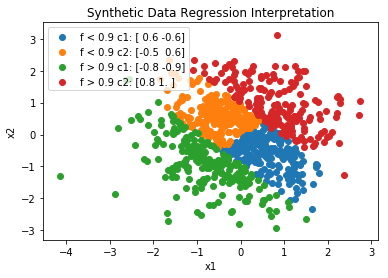

In [0]:
ind_sequence= model.sequence_indices
for i in range(K):
  a = ind_sequence[i]
  b = ind_sequence[i+1]  
  data  = model.Xs_transform[a:b] 
  for j in range(num_clusters):
        index_cluster = np.where(np.array(model.cluster_index[a:b])==j)[0]
        if(i==0):
          name = 'f < '+ str(round(model.sequence_indices_predns[1],1))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i][j],1))
        if(i==1):
          name = 'f > '+ str(round(model.sequence_indices_predns[1],1))+ ' c' + str(j+1)  + ': ' + str(np.round(model.cluster_centers[i][j],1))     
#         print (name)
        plt.scatter(data[index_cluster,0], data[index_cluster,1], label= name)
#         plt.title('Scatter plot pythonspot.com')
        plt.legend()
        plt.title("Synthetic Data Regression Interpretation")
        plt.xlabel('x1')
        plt.ylabel('x2')
plt.savefig('/content/gdrive/My Drive/Allerton_SPL/IEEE-SPL-LaTeX/PCA_H2_W2_EQ_syn.pdf')        

## Initialize piecewise model: Equal Quantile, K=4, N_clus=1

In [0]:
K=4
normalize = 0
delta = 1
num_clusters =1
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'false', min_clus, 'equal_quantile')

## Fit a piecewise model

In [0]:
model.fit(train,Y_train)

In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

## Piecewise model (Fidelity and MSE)

In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 1.1938772064219891
Fidelity of constant model 4.613383845318623
MSE of piecewise model 1.5187668940191372
MSE of constant model 5.437507789315265


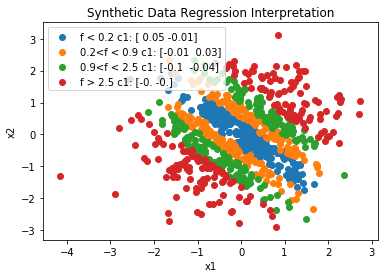

In [0]:
ind_sequence= model.sequence_indices
for i in range(K):
  a = ind_sequence[i]
  b = ind_sequence[i+1]  
  data  = model.Xs_transform[a:b] 
  for j in range(num_clusters):
        index_cluster = np.where(np.array(model.cluster_index[a:b])==j)[0]
        if(i==0):
          name = 'f < '+ str(round(model.sequence_indices_predns[i+1],2))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i],2))
        if(i==1 or i==2):
          name = str(round(model.sequence_indices_predns[i],1))+ '<f < '+ str(round(model.sequence_indices_predns[i+1],1))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i],2))
        if(i==3):
          name = 'f > '+ str(round(model.sequence_indices_predns[i],1))+ ' c' + str(j+1)  + ': ' + str(np.round(model.cluster_centers[i],1))     
          
#         print (name)
        plt.scatter(data[index_cluster,0], data[index_cluster,1], label= name)
#         plt.title('Scatter plot pythonspot.com')
        plt.legend()
        plt.title("Synthetic Data Regression Interpretation")
        plt.xlabel('x1')
        plt.ylabel('x2')
        
plt.savefig('/content/gdrive/My Drive/Allerton_SPL/IEEE-SPL-LaTeX/PCA_H4_W1_EQ_syn.pdf')
#         plt.show()
# ind_sequence= model.sequence_indices
# for i in range(K):
#   a = ind_sequence[i]
#   b = ind_sequence[i+1]  
#   data  = model.Xs_transform[a:b] 
#   for j in range(num_clusters):
#         index_cluster = np.where(np.array(model.cluster_index[a:b])==j)[0]
#         if(i==0):
#           name = 'f < '+ str(round(model.sequence_indices_predns[1],1))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i][j],1))
#         if(i==1):
#           name = 'f > '+ str(round(model.sequence_indices_predns[1],1))+ ' c' + str(j+1)  + ': ' + str(np.round(model.cluster_centers[i][j],1))     
# #         print (name)
#         plt.scatter(data[index_cluster,0], data[index_cluster,1], label= name)
# #         plt.title('Scatter plot pythonspot.com')
#         plt.legend()
#         plt.title("Synthetic Data Regression Interpretation")
#         plt.xlabel('x1')
#         plt.ylabel('x2')
# plt.savefig('/content/gdrive/My Drive/Allerton_SPL/IEEE-SPL-LaTeX/PCA_H4_W1_EQ_syn.pdf')          

## Initialize piecewise model: Optimal, K=4, N_clus=1

In [0]:
K=4
normalize = 0
delta = 1
num_clusters =1
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'false', min_clus, 'optimal')

## Fit a piecewise model

In [0]:
model.fit(train,Y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordina

In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

## Piecewise model (Fidelity and MSE)

In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))


Fidelity of piecewise model 0.5408570325450971
Fidelity of constant model 4.613383845318623
MSE of piecewise model 0.7348527682180622
MSE of constant model 5.437507789315265


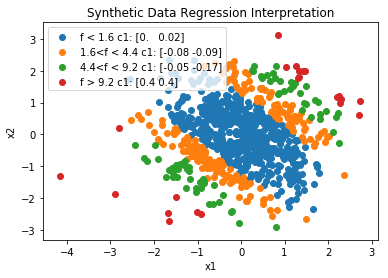

In [0]:
ind_sequence= model.sequence_indices
for i in range(K):
  a = ind_sequence[i]
  b = ind_sequence[i+1]  
  data  = model.Xs_transform[a:b] 
  for j in range(num_clusters):
        index_cluster = np.where(np.array(model.cluster_index[a:b])==j)[0]
        if(i==0):
          name = 'f < '+ str(round(model.sequence_indices_predns[i+1],2))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i],2))
        if(i==1 or i==2):
          name = str(round(model.sequence_indices_predns[i],1))+ '<f < '+ str(round(model.sequence_indices_predns[i+1],1))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i],2))
        if(i==3):
          name = 'f > '+ str(round(model.sequence_indices_predns[i],1))+ ' c' + str(j+1)  + ': ' + str(np.round(model.cluster_centers[i],1))     
          
#         print (name)
        plt.scatter(data[index_cluster,0], data[index_cluster,1], label= name)
#         plt.title('Scatter plot pythonspot.com')
        plt.legend()
        plt.title("Synthetic Data Regression Interpretation")
        plt.xlabel('x1')
        plt.ylabel('x2')
        
plt.savefig('/content/gdrive/My Drive/Allerton_SPL/IEEE-SPL-LaTeX/PCA_H4_W1_OP_syn.pdf')
#         plt.show()


## Initialize piecewise model: Optimal, K=2, N_clus=2

In [0]:
K=2
normalize = 0
delta = 1
num_clusters =2
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'false', min_clus, 'optimal')

## Fit a piecewise model

In [0]:
model.fit(train,Y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordina

In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

## Piecewise model (Fidelity and MSE)

In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 0.18688873079127297
Fidelity of constant model 4.613383845318623
MSE of piecewise model 0.11460442600019582
MSE of constant model 5.437507789315265


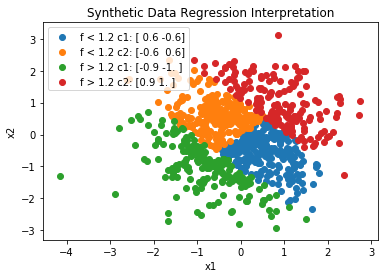

In [0]:
ind_sequence= model.sequence_indices
for i in range(K):
  a = ind_sequence[i]
  b = ind_sequence[i+1]  
  data  = model.Xs_transform[a:b] 
  for j in range(num_clusters):
        index_cluster = np.where(np.array(model.cluster_index[a:b])==j)[0]
        if(i==0):
          name = 'f < '+ str(round(model.sequence_indices_predns[1],1))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i][j],1))
        if(i==1):
          name = 'f > '+ str(round(model.sequence_indices_predns[1],1))+ ' c' + str(j+1)  + ': ' + str(np.round(model.cluster_centers[i][j],1))     
#         print (name)
        plt.scatter(data[index_cluster,0], data[index_cluster,1], label= name)
#         plt.title('Scatter plot pythonspot.com')
        plt.legend()
        plt.title("Synthetic Data Regression Interpretation")
        plt.xlabel('x1')
        plt.ylabel('x2')
plt.savefig('/content/gdrive/My Drive/Allerton_SPL/IEEE-SPL-LaTeX/PCA_H2_W2_OP_syn.pdf')          

## Initialize piecewise model: Optimal, K=1, N_clus=4

In [0]:
K=1
normalize = 0
delta = 1
num_clusters =4
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'false', min_clus, 'optimal')

## Fit a piecewise model

In [0]:
model.fit(train,Y_train)

In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))


Fidelity of piecewise model 0.7061596232245266
Fidelity of constant model 4.613383845318623
MSE of piecewise model 0.6975947327434575
MSE of constant model 5.437507789315265


## Piecewise model (Fidelity and MSE)

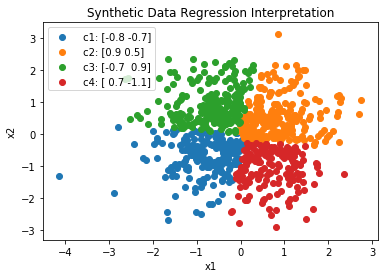

In [0]:
ind_sequence= model.sequence_indices
for i in range(1):
  a = ind_sequence[i]
  b = ind_sequence[i+1]  
  data  = model.Xs_transform[a:b] 
  for j in range(4):
        index_cluster = np.where(np.array(model.cluster_index[a:b])==j)[0]
        if(i==0):
          name = ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i][j],1))
#         if(i==1 or i==2):
#           name = str(round(model.sequence_indices_predns[i],0))+ '<f < '+ str(round(model.sequence_indices_predns[i+1],0))+ ' c' + str(j+1) + ': ' + str(np.round(model.cluster_centers[i],1))
#         if(i==3):
#           name = 'f > '+ str(round(model.sequence_indices_predns[i],0))+ ' c' + str(j+1)  + ': ' + str(np.round(model.cluster_centers[i],1))     
          
#         print (name)
        plt.scatter(data[index_cluster,0], data[index_cluster,1], label= name)
#         plt.title('Scatter plot pythonspot.com')
        plt.legend()
        plt.title("Synthetic Data Regression Interpretation")
        plt.xlabel('x1')
        plt.ylabel('x2')
plt.savefig('/content/gdrive/My Drive/Allerton_SPL/IEEE-SPL-LaTeX/PCA_H1_W4_OP_syn.pdf')  

## Linear model (Fidelity and MSE)

In [0]:
model_linear = linear_model.LinearRegression(fit_intercept=True) 
model_linear.fit(train, Y_train)
print ("Fidelity of the linear model is : " + str(np.mean((model_linear.predict(test)-Y_test)**2)))
print ("MSE of linear model is : " + str(np.mean((model_linear.predict(test)-labels_test)**2)))

Fidelity of the linear model is : 4.6000561746914705
MSE of linear model is : 5.4108020141522255


In [0]:
model_linear = linear_model.LinearRegression(fit_intercept=True) 
model_linear.fit(train, Y_train)
print("Linear model  R^2 Score: " +str(round(r2_score(model_linear.predict(test),Y_test),3)))
print ("Fidelity of the linear model is : " + str(np.mean((model_linear.predict(test)-Y_test)**2)))
print("Linear model  R^2 Score: " +str(round(r2_score(model_linear.predict(test),labels_test),3)))
print ("MSE of linear model is : " + str(np.mean((model_linear.predict(test)-labels_test)**2)))

Linear model  R^2 Score: -270.571
Fidelity of the linear model is : 5.757623045814499
Linear model  R^2 Score: -352.965
MSE of linear model is : 7.504478890901619


In [0]:
model_linear = linear_model.LinearRegression(fit_intercept=True) 
model_linear.fit(train, labels_train)
print("Linear model  R^2 Score: " +str(round(r2_score(model_linear.predict(test),Y_test),3)))
print ("Fidelity of the linear model is : " + str(np.mean((model_linear.predict(test)-Y_test)**2)))
print("Linear model  R^2 Score: " +str(round(r2_score(model_linear.predict(test),labels_test),3)))
print ("MSE of linear model is : " + str(np.mean((model_linear.predict(test)-labels_test)**2)))

Linear model  R^2 Score: -251.034
Fidelity of the linear model is : 5.767548218101991
Linear model  R^2 Score: -327.022
MSE of linear model is : 7.506469248706445


In [0]:
r2_score(labels_test, model_linear.predict(test))

0.002671097713220383

## Regression Tree (Fidelity and MSE)

In [0]:
model_tree = tree.DecisionTreeRegressor(max_leaf_nodes=4)
model_tree = model_tree.fit(train, Y_train)
print("Tree model  R^2 Score: " +str(round(r2_score(model_tree.predict(test),Y_test),3)))
print ("Fidelity of the regression tree model is : " + str(np.mean((model_tree.predict(test)-Y_test)**2)))
print("Tree model R^2 Score: " +str(round(r2_score(model_tree.predict(test),labels_test),3)))
print ("MSE of regression tree model is : " + str(np.mean((model_tree.predict(test)-labels_test)**2)))

Tree model  R^2 Score: -1.076
Fidelity of the regression tree model is : 3.8134234928427895
Tree model R^2 Score: -1.452
MSE of regression tree model is : 4.5044567025646725


In [0]:
model_tree = tree.DecisionTreeRegressor(max_leaf_nodes=4)
model_tree = model_tree.fit(train, labels_train)
print("Tree model  R^2 Score: " +str(round(r2_score(model_tree.predict(test),Y_test),3)))
print ("Fidelity of the regression tree model is : " + str(np.mean((model_tree.predict(test)-Y_test)**2)))
print("Tree model R^2 Score: " +str(round(r2_score(model_tree.predict(test),labels_test),3)))
print ("MSE of regression tree model is : " + str(np.mean((model_tree.predict(test)-labels_test)**2)))

Tree model  R^2 Score: -16.102
Fidelity of the regression tree model is : 4.340343557905211
Tree model R^2 Score: -19.392
MSE of regression tree model is : 5.175311345856311


## Large Data 

In [0]:
class piecewise_model_extension:
    def __init__(self,  K, model_type, delta,  black_box, n_components, n_clusters, project, min_clus):
        self.K   = K
        self.model_type = model_type
        self.sequence_indices = []
        self.sequence_indices_predns = []
        self.Ys = []
        self.Xs = []
        self.Xs_transform = []
        self.cluster_index  = []
        self.normalize = normalize
        self.black_box = black_box
        self.model_list = {}
        self.n_components = n_components
        self.n_clusters   = n_clusters
        self.project      = project
        self.cluster_centers = []
        self.number_clusters = {}
        self.min_clus  = min_clus
        self.model_transform = []
        self.delta           = delta     
    
    def fit(self, X,Y):
#         if (self.normalize == 1):
# #             print (X.mean(0))
#             X = (X-X.mean(0))/X.std(0)       
        self.Ys = np.sort(Y)
        self.Xs = X[np.argsort(Y)]   
        self.Xs_transform =  X[np.argsort(Y)] 
        
        if(self.project == 'true'):
            self.Xs_transform = self.data_projection()
      
        N      = self.Xs.shape[0]
        K      = self.K
        self.cluster_index = [0.0]*(N)
        self.cluster_centers = [0.0]*(K)
        self.V   = np.zeros((N,K))
        self.Ind = np.zeros((N,K))
        
        
        delta = self.delta
        
        
        n_elements = np.int((N-1)/delta)  
        range_N = np.linspace(2,N, n_elements).astype(int)
        set_N = set(range_N)
        
        for n in range_N:
            for k in range(1,K+1):
                if (k==1):
                    self.V[(n-1),(0)] = self.G(0,(n)) 
                    self.Ind[(n-1),(0)] =0
                if (k>1):
                      Value_pos = np.ones(n-1)*100000
                      current_min  = 1000000
                      
                      set_n_c = set(range(1,n-1) )
                      
                      set_n = set_N.intersection(set_n_c)
                      range_n = list(set_n)
                      for n_p in range_n:
                              Value_pos[n_p-1] = self.V[(n_p-1),(k-2)] + self.G(n_p,(n)) 
​
                      self.V[(n-1),(k-1)]     = np.min(Value_pos)
                      self.Ind[(n-1),(k-1)]   = np.argmin(Value_pos)
#                     print (Value_pos)
        self.generate_model_list_extension()
        
​
    def G(self, i,j):
        Ys = self.Ys
        Xs = self.Xs
        min_clus = self.min_clus
        Y  = Ys[i:j]
        X  = Xs[i:j]
​
        n_clusters = self.n_clusters
        if(self.model_type == 'constant'):
            Y_ls = np.sum(np.square(Y-np.mean(Y)))
            return Y_ls
        
        
        if(self.model_type == 'linear'):
            if(n_clusters == 1 or j<i+min_clus):
              reg = linear_model.LinearRegression(fit_intercept=True)   
              reg.fit(X, Y)
              Yp   = reg.predict(X)
              Y_ls = np.sum(np.square(Y-Yp))     
            else:
              self.data_cluster(i,j)
              Y_ls = 0
              for k in range(n_clusters):
                index_cluster = np.where(np.array(self.cluster_index[i:j])==k)[0]
​
                if(len(index_cluster)>=1):
#                   print (len(index_cluster))
#                   print (index_cluster)
                  reg = linear_model.LinearRegression(fit_intercept=True) 
#                   print(X[index_cluster].shape[0])
                  reg.fit(X[index_cluster], Y[index_cluster])
                  Yp   = reg.predict(X[index_cluster])
                  Y_ls += np.sum(np.square(Y[index_cluster]-Yp))  
            
            return Y_ls
    def data_projection(self):
        Xs = self.Xs
        pca = PCA(n_components=self.n_components)
        data = pca.fit_transform(Xs)
        plt.scatter(data[:,0], data[:,1])
#         plt.title('Scatter plot pythonspot.com')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.show()
        self.model_transform = pca
​
        return data
    
    def data_cluster(self,i,j):
        Xs_transform = self.Xs_transform
        X_t = Xs_transform[i:j]
        n_clusters = self.n_clusters     
        kmeans = KMeans(n_clusters=n_clusters, random_state=0)
        self.cluster_index[i:j] = kmeans.fit_predict(X_t)
#         print (self.cluster_index[i:j])
        
    def data_cluster_final(self,i,j,k):
        Xs_transform = self.Xs_transform
        X_t = Xs_transform[i:j]
        n_clusters = self.n_clusters     
        kmeans = KMeans(n_clusters=n_clusters, random_state=0)
        self.cluster_index[i:j] = kmeans.fit_predict(X_t)        
        self.cluster_centers[k] = kmeans.cluster_centers_
        
        
    def Ind_sequence(self):
        ind_sequence = []
        N      = self.Xs.shape[0] 
        K_rem  = self.K
        N_rem  = N
        while (N_rem>1):
            index = int(self.Ind[N_rem-1,K_rem-1])
            ind_sequence.append(index)
            N_rem = index - 1
            K_rem = K_rem - 1
        ind_sequence.reverse()
        ind_sequence.append(N-1)
        self.sequence_indices = ind_sequence
​
        
    def generate_model_list_extension(self):
#         print (self.sequence_indices)
        min_clus = self.min_clus
        n_clusters = self.n_clusters
        self.Ind_sequence()
#         print (self.sequence_indices)
        Ys = self.Ys
        Xs = self.Xs
        ind_sequence= self.sequence_indices 
        L = len(ind_sequence)
#         print (L)
        Xb = Xs[ind_sequence]
        self.sequence_indices_predns = self.black_box.predict(Xb)
        for i in range(L-1):
            a = ind_sequence[i]
            b = ind_sequence[i+1]
            Y  = Ys[a:b]
            X  = Xs[a:b]            
            if(self.model_type == 'linear'):
                if(n_clusters == 1 or b<a+min_clus):
                  reg = linear_model.LinearRegression(fit_intercept=True)   
                  reg.fit(X, Y)
                  Yp   = reg.predict(X)
                  Y_ls = np.sum(np.square(Y-Yp))  
                  Xt   = self.model_transform.transform(X)   
                  self.cluster_centers[i] = Xt.mean(0)  
                  self.model_list[i,0] = reg
                  self.number_clusters[i] = 1 
                else:                
                  self.data_cluster_final(a,b,i)
                  Y_ls = 0
                  self.number_clusters[i] = 0
                  for k in range(n_clusters):
                    index_cluster = np.where(np.array(self.cluster_index[a:b])==k)[0]
​
                    if(len(index_cluster)>=1):
    #                   print (len(index_cluster))
    #                   print (index_cluster)
                      reg = linear_model.LinearRegression(fit_intercept=True) 
    #                   print(X[index_cluster].shape[0])
                      reg.fit(X[index_cluster], Y[index_cluster])    
                      self.model_list[i,k] = reg  
                      self.number_clusters[i] += 1
​
​
        
                
                
    def predict_extension(self, x):
​
        
        pred_val = self.black_box.predict(x)
        model_list = self.model_list
        K=self.K
        b_predns = self.sequence_indices_predns
        
        len_bpred = len(b_predns)
        
        for j in range(len_bpred):
            if(j==0):
              if(pred_val <= b_predns[j]):
                ind_min = j
            if(j < len_bpred-1):    
                if (pred_val <= b_predns[j+1] and pred_val> b_predns[j]):
                    ind_min = j
            if(j== len_bpred- 1):
                if(pred_val > b_predns[j]):
                    ind_min = j-1
            
      
        cluster_centers = np.array(self.cluster_centers[ind_min])
        x_trans = self.model_transform.transform((x.reshape(-1,1)).T)       
        ind_clus = np.argmin(np.sum(np.square(x_trans-cluster_centers), axis=1))
        L = len(cluster_centers)
        
        
        
        
        
        if(pred_val>b_predns[ind_min]):
            if(ind_min < (len(b_predns)-1)):
                approx_pred = model_list[ind_min,ind_clus].predict(x)
#                 print ("error is:" + str((approx_pred- pred_val)**2))
                return np.maximum(np.minimum(approx_pred,b_predns[ind_min+1]), b_predns[ind_min])
            if(ind_min == len(b_predns)-1):
                approx_pred = model_list[ind_min,ind_clus].predict(x)
#                 print ("error is:" + str((approx_pred- pred_val)**2))
                return np.minimum(approx_pred,b_predns[ind_min])
            
        if(pred_val<=b_predns[ind_min]):
            if(ind_min >0):
                approx_pred = model_list[ind_min-1, ind_clus].predict(x)
#                 print ("error is:" + str((approx_pred- pred_val)**2))
                return np.maximum(np.minimum(approx_pred,b_predns[ind_min]), b_predns[ind_min-1])
            if(ind_min == 0):
                approx_pred = model_list[ind_min, ind_clus].predict(x)
#                 print ("error is:" + str((approx_pred- pred_val)**2))
                return np.maximum(approx_pred, b_predns[ind_min])               
        
     
    def model_interpretations_extension(self):
        Ys = self.Ys
        Xs = self.Xs
        ind_sequence= self.sequence_indices 
        L = len(ind_sequence)      
        ind_vector = {}
        coef_vector = {}
        for i in range(L-1):
          k = self.number_clusters[i]
          for j in range(k):
            if (self.model_type == 'linear'):
              model = self.model_list[i,j]
              coeff = np.abs(model.coef_)
              f_ind = np.argsort(-coeff)
              ind_vector[i,j]= f_ind
              coef_vector[i,j] = coeff[f_ind]
              
        
        return ind_vector, coef_vector
        
        
        
    def model_interpretations(self):
        Ys = self.Ys
        Xs = self.Xs
        ind_sequence= self.sequence_indices 
        L = len(ind_sequence)
#         print (L)
        ind_vector  = {}
#         print (Xs)
        for i in range(L-1):
            a = ind_sequence[i]
            b = ind_sequence[i+1]
            if(self.model_type == 'linear'):
                reg = linear_model.LinearRegression(fit_intercept=True)   
                reg.fit(Xs[a:b], Ys[a:b])
                coeff = np.abs(reg.coef_)
                f_ind = np.argsort(-coeff)
                ind_vector[i] = f_ind 

        return ind_vector  

SyntaxError: ignored

In [0]:
class piecewise_model_new_approx:
    def __init__(self,  K, model_type, delta,  black_box, n_components, n_clusters, project, min_clus, fit_type):
        self.K   = K
        self.model_type = model_type
        self.sequence_indices = []
        self.sequence_indices_predns = []
        self.Ys = []
        self.Xs = []
        self.Xs_transform = []
        self.cluster_index  = []
        self.normalize = normalize
        self.black_box = black_box
        self.model_list = {}
        self.n_components = n_components
        self.n_clusters   = n_clusters
        self.project      = project
        self.cluster_centers = []
        self.number_clusters = {}
        self.min_clus  = min_clus
        self.model_transform = []
        self.fit_type = fit_type
        
    
    def fit(self, X,Y):  
        self.Ys = np.sort(Y)
        self.Xs = X[np.argsort(Y)] 
        N      = self.Xs.shape[0]
        K      = self.K
        self.cluster_index = [0.0]*(N)
        self.cluster_centers = [0.0]*(K)       
        
        if(self.project == 'true'):
          self.Xs_transform = self.data_projection()
        if(self.project == 'false'):
          self.Xs_transform = self.Xs
          
        if(self.fit_type == 'optimal'): 
          self.Ys = np.sort(Y)
          self.Xs = X[np.argsort(Y)]   
#           self.Xs_transform =  X[np.argsort(Y)] 




          self.V   = np.zeros((N,K))
          self.Ind = np.zeros((N,K))
          n_elements = np.int((N-1)/delta)  
          range_N = np.linspace(2,N, n_elements).astype(int)
          set_N = set(range_N)

          for n in range_N:
              for k in range(1,K+1):
                  if (k==1):
                      self.V[(n-1),(0)] = self.G(0,(n)) 
                      self.Ind[(n-1),(0)] =0
                  if (k>1):
                      Value_pos = np.zeros(n-1)
                      current_min  = 1000000
                      set_n_c = set(range(1,n-1) )
                      
                      set_n = set_N.intersection(set_n_c)
                      range_n = list(set_n)
                      for n_p in range_n:
                              Value_pos[n_p-1] = self.V[(n_p-1),(k-2)] + self.G(n_p,(n)) 

                      self.V[(n-1),(k-1)]     = np.min(Value_pos)
                      self.Ind[(n-1),(k-1)]   = np.argmin(Value_pos)
  #                     print (Value_pos)
          self.generate_model_list_extension()
        
        if (self.fit_type == 'equal_quantile'):
          self.Ys = np.sort(Y)
          self.Xs = X[np.argsort(Y)]   
          if(self.project == 'true'):
            self.Xs_transform = self.data_projection()     
          if(self.project == 'false'):  
            self.Xs_transform = self.Xs
          self.generate_model_list_extension()           
      

    def G(self, i,j):
        Ys = self.Ys
        Xs = self.Xs
        min_clus = self.min_clus
        Y  = Ys[i:j]
        X  = Xs[i:j]

        n_clusters = self.n_clusters
        if(self.model_type == 'constant'):
            Y_ls = np.sum(np.square(Y-np.mean(Y)))
            return Y_ls
        
        
        if(self.model_type == 'linear'):
            if(n_clusters == 1 or j<i+min_clus):
              reg = linear_model.Lasso(alpha=0.001,fit_intercept=True)   
              reg.fit(X, Y)
              Yp   = reg.predict(X)
              Y_ls = np.sum(np.square(Y-Yp))     
            else:
              self.data_cluster(i,j)
              Y_ls = 0
              for k in range(n_clusters):
                index_cluster = np.where(np.array(self.cluster_index[i:j])==k)[0]

                if(len(index_cluster)>=1):
#                   print (len(index_cluster))
#                   print (index_cluster)
                  reg = linear_model.Lasso(alpha=0.001, fit_intercept=True) 
#                   print(X[index_cluster].shape[0])
                  reg.fit(X[index_cluster], Y[index_cluster])
                  Yp   = reg.predict(X[index_cluster])
                  Y_ls += np.sum(np.square(Y[index_cluster]-Yp))  
            
            return Y_ls
    def data_projection(self):
        Xs = self.Xs
        pca = PCA(n_components=self.n_components)
        data = pca.fit_transform(Xs)
        plt.scatter(data[:,0], data[:,1])
#         plt.title('Scatter plot pythonspot.com')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.show()
        self.model_transform = pca

        return data
    
    def data_cluster(self,i,j):
        Xs_transform = self.Xs_transform
        X_t = Xs_transform[i:j]
        n_clusters = self.n_clusters     
        kmeans = KMeans(n_clusters=n_clusters, random_state=0)
        self.cluster_index[i:j] = kmeans.fit_predict(X_t)
#         print (self.cluster_index[i:j])
        
    def data_cluster_final(self,i,j,k):
        Xs_transform = self.Xs_transform
        X_t = Xs_transform[i:j]
        n_clusters = self.n_clusters     
        kmeans = KMeans(n_clusters=n_clusters, random_state=0)
        self.cluster_index[i:j] = kmeans.fit_predict(X_t)        
        self.cluster_centers[k] = kmeans.cluster_centers_
        
        
    def Ind_sequence(self):
        if(self.fit_type == 'optimal'):
          ind_sequence = []
          N      = self.Xs.shape[0] 
          K_rem  = self.K
          N_rem  = N
          while (N_rem>1):
              index = int(self.Ind[N_rem-1,K_rem-1])
              ind_sequence.append(index)
              N_rem = index - 1
              K_rem = K_rem - 1
          ind_sequence.reverse()
          ind_sequence.append(N-1)
          self.sequence_indices = ind_sequence

        if(self.fit_type == 'equal_quantile'):
          data_size = self.Xs.shape[0]
          K=self.K
          q = np.linspace(0,1,K+1)
#           print (q)
          self.sequence_indices= np.quantile(range(data_size), q=q).astype(int) 
  
  
        
    def generate_model_list_extension(self):
#         print (self.sequence_indices)
        min_clus = self.min_clus
        n_clusters = self.n_clusters
        self.Ind_sequence()
#         print (self.sequence_indices)
        Ys = self.Ys
        Xs = self.Xs
        ind_sequence= self.sequence_indices 
        L = len(ind_sequence)
#         print (L)
        Xb = Xs[ind_sequence]
        self.sequence_indices_predns = self.black_box.predict(Xb)
        for i in range(L-1):
            a = ind_sequence[i]
            b = ind_sequence[i+1]
            Y  = Ys[a:b]
            X  = Xs[a:b]            
            if(self.model_type == 'linear'):
                if(n_clusters == 1 or b<a+min_clus):
                  reg = linear_model.Lasso(alpha=0.01,fit_intercept=True)   
                  reg.fit(X, Y)
                  Yp   = reg.predict(X)
                  Y_ls = np.sum(np.square(Y-Yp))  
                  if(self.project == 'true'):
                    Xt   = self.model_transform.transform(X)   
                  if(self.project == 'false'):
                    Xt  = X
                  self.cluster_centers[i] = Xt.mean(0)  
                  self.model_list[i,0] = reg
                  self.number_clusters[i] = 1 
                else:                
                  self.data_cluster_final(a,b,i)
                  Y_ls = 0
                  self.number_clusters[i] = 0
                  for k in range(n_clusters):
                    index_cluster = np.where(np.array(self.cluster_index[a:b])==k)[0]

                    if(len(index_cluster)>=1):
    #                   print (len(index_cluster))
    #                   print (index_cluster)
                      reg = linear_model.Lasso(alpha=0.01,fit_intercept=True) 
    #                   print(X[index_cluster].shape[0])
                      reg.fit(X[index_cluster], Y[index_cluster])    
                      self.model_list[i,k] = reg  
                      self.number_clusters[i] += 1


        
                
                
    def predict_extension(self, x):

        
        pred_val = self.black_box.predict(x)
        model_list = self.model_list
        K=self.K
        b_predns = self.sequence_indices_predns
        
        len_bpred = len(b_predns)
        
        for j in range(len_bpred):
            if(j==0):
              if(pred_val <= b_predns[j]):
                ind_min = j
            if(j < len_bpred-1):    
                if (pred_val <= b_predns[j+1] and pred_val> b_predns[j]):
                    ind_min = j
            if(j== len_bpred- 1):
                if(pred_val > b_predns[j]):
                    ind_min = j-1
            
      
        cluster_centers = np.array(self.cluster_centers[ind_min])
        if(self.project=='true'):
          x_trans = self.model_transform.transform((x.reshape(-1,1)).T) 
        if(self.project == 'false'):
          x_trans = (x.reshape(-1,1)).T
        
        ind_clus = np.argmin(np.sum(np.square(x_trans-cluster_centers), axis=1))
        L = len(cluster_centers)
        
        
        
        
        
        if(pred_val>b_predns[ind_min]):
            if(ind_min < (len(b_predns)-1)):
                approx_pred = model_list[ind_min,ind_clus].predict(x)
#                 print ("error is:" + str((approx_pred- pred_val)**2))
                return np.maximum(np.minimum(approx_pred,b_predns[ind_min+1]), b_predns[ind_min])
            if(ind_min == len(b_predns)-1):
                approx_pred = model_list[ind_min,ind_clus].predict(x)
#                 print ("error is:" + str((approx_pred- pred_val)**2))
                return np.minimum(approx_pred,b_predns[ind_min])
            
        if(pred_val<=b_predns[ind_min]):
            if(ind_min >0):
                approx_pred = model_list[ind_min-1, ind_clus].predict(x)
#                 print ("error is:" + str((approx_pred- pred_val)**2))
                return np.maximum(np.minimum(approx_pred,b_predns[ind_min]), b_predns[ind_min-1])
            if(ind_min == 0):
                approx_pred = model_list[ind_min, ind_clus].predict(x)
#                 print ("error is:" + str((approx_pred- pred_val)**2))
                return np.maximum(approx_pred, b_predns[ind_min])               
        
     
    def model_interpretations_extension(self):
        Ys = self.Ys
        Xs = self.Xs
        ind_sequence= self.sequence_indices 
        L = len(ind_sequence)      
        ind_vector = {}
        coef_vector = {}
        for i in range(L-1):
          k = self.number_clusters[i]
          for j in range(k):
            if (self.model_type == 'linear'):
              model = self.model_list[i,j]
              coeff = np.abs(model.coef_)
              f_ind = np.argsort(-coeff)
              ind_vector[i,j]= f_ind
              coef_vector[i,j] = coeff[f_ind]
              
        
        return ind_vector, coef_vector
        
        
        
    def model_interpretations(self):
        Ys = self.Ys
        Xs = self.Xs
        ind_sequence= self.sequence_indices 
        L = len(ind_sequence)
#         print (L)
        ind_vector  = {}
#         print (Xs)
        for i in range(L-1):
            a = ind_sequence[i]
            b = ind_sequence[i+1]
            if(self.model_type == 'linear'):
                reg = linear_model.LinearRegression(fit_intercept=True)   
                reg.fit(Xs[a:b], Ys[a:b])
                coeff = np.abs(reg.coef_)
                f_ind = np.argsort(-coeff)
                ind_vector[i] = f_ind 

        return ind_vector    
      
    def compute_cluster_centers(self):
      Xs           = self.Xs
      Xs_transform = self.Xs_transform
      cluster_centers = self.cluster_centers
      n_clusters = self.n_clusters
      
      K          = self.K
      ind_sequence= self.sequence_indices 

      cluster_centers_original = {}
      index_centers_original = {}
      
      for i in range(K):
        a = ind_sequence[i]
        b = ind_sequence[i+1]
        ind_sequence_cont = range(a,b)
        Xs_transform_ab = Xs_transform[a:b]
        Xs_ab           = Xs[a:b]  
        for j in range(n_clusters):
          c = cluster_centers[i][j]
          index_min = np.argmin(np.sum(np.abs(Xs_transform_ab-c)**2, axis=1))
          
          cluster_centers_original[i,j] = Xs_ab[index_min]
          index_centers_original[i,j] = ind_sequence_cont[index_min]
      return cluster_centers_original, index_centers_original


Random Forest R^2 Score: 0.754
Random Forest MSError 0.25677755051791357
MSError when predicting the mean 1.3349752490945057


In [0]:
mean = np.zeros(2)
cov = np.eye(2)
data= np.random.multivariate_normal(mean, cov, 10000)
target = np.zeros(10000)

for i in range(data.shape[0]):
  target[i] = non_linear_example(data[i])

In [0]:
rf = sklearn.ensemble.RandomForestRegressor(n_estimators=1000)
train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(data, target, train_size=0.80, test_size=0.20)

rf.fit(train, labels_train);
print("Random Forest R^2 Score: " +str(round(r2_score(rf.predict(test),labels_test),3)))
print('Random Forest MSError', np.mean((rf.predict(test) - labels_test) ** 2))
print('MSError when predicting the mean', np.mean((labels_train.mean() - labels_test) ** 2))

Random Forest R^2 Score: 0.989
Random Forest MSError 0.08741530230445799
MSError when predicting the mean 8.1856075566439


In [0]:
Y_train  = rf.predict(train)
Y_test   = rf.predict(test)

In [0]:
K=4
normalize = 0
delta = 1
num_clusters =1
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'false', min_clus, 'equal_quantile')

In [0]:
start = time.time()
model.fit(train,Y_train)
end   = time.time()
print (end-start)

0.06969094276428223


In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 2.684833669108787
Fidelity of constant model 7.613750920165948
MSE of piecewise model 3.0481730213495104
MSE of constant model 8.186171367802267


In [0]:
index_train= np.random.choice(range(train.shape[0]),800, replace=False)
index_test = np.random.choice(range(test.shape[0]),200, replace=False)

In [0]:
train  = train[index_train]
test   = test[index_test]
labels_train = labels_train[index_train]
labels_test = labels_test[index_test]

In [0]:
Y_train  = rf.predict(train)
Y_test   = rf.predict(test)

In [0]:
K=4
normalize = 0
delta = 1
num_clusters =1
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'false', min_clus, 'optimal')

In [0]:
start = time.time()
model.fit(train,Y_train)
end   = time.time()
print (end-start)

In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 0.806681924074439
Fidelity of constant model 6.961871092481013
MSE of piecewise model 1.0830648887168814
MSE of constant model 7.777770803125645


In [0]:
california = fetch_california_housing()
rf = sklearn.ensemble.RandomForestRegressor(n_estimators=1000)
train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(california.data, california.target, train_size=0.80, test_size=0.20)
mean = train.mean(0)
std = train.std(0)
train = (train-mean)/std
test  = (test-mean)/std

rf.fit(train, labels_train);
print("Random Forest R^2 Score: " +str(round(r2_score(rf.predict(test),labels_test),3)))
print('Random Forest MSError', np.mean((rf.predict(test) - labels_test) ** 2))
print('MSError when predicting the mean', np.mean((labels_train.mean() - labels_test) ** 2))

Random Forest R^2 Score: 0.761
Random Forest MSError 0.2474441819688978
MSError when predicting the mean 1.346568882214594


In [0]:
Y_train  = rf.predict(train)
Y_test   = rf.predict(test)

In [0]:
K=4
normalize = 0
delta = 50
num_clusters =1
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new_approx(K, 'linear', delta,  rf,num_components, num_clusters, 'false', min_clus, 'equal_quantile')

In [0]:
start = time.time()
model.fit(train,Y_train)
end   = time.time()
print (end-start)

0.08250236511230469


In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 0.08412898097846283
Fidelity of constant model 1.0333349572257862
MSE of piecewise model 0.33280592549312776
MSE of constant model 1.3465771491761116


In [0]:
index_train= np.random.choice(range(train.shape[0]),800, replace=False)
index_test = np.random.choice(range(test.shape[0]),200, replace=False)

In [0]:
train  = train[index_train]
test   = test[index_test]
labels_train = labels_train[index_train]
labels_test = labels_test[index_test]

In [0]:
Y_train  = rf.predict(train)
Y_test   = rf.predict(test)

In [0]:
K=4
normalize = 0
delta = 1
num_clusters =1
num_components = 2
min_clus = 50
# model = piecewise_model_extension(K, 'linear', delta,  rf,num_components, num_clusters, 'true', min_clus)
model = piecewise_model_new(K, 'linear', delta,  rf,num_components, num_clusters, 'false', min_clus, 'optimal')

In [0]:
start = time.time()
model.fit(train,Y_train)
end   = time.time()
print (end-start)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordina

700.0249969959259


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  positive)


In [0]:
predict_test = [0.0]*test.shape[0]
for i in range(test.shape[0]):
    predict_test[i] = model.predict_extension((test[i].reshape(-1,1)).T)

In [0]:
print ("Fidelity of piecewise model " + str(np.mean((np.array(predict_test).T[0]-Y_test)**2)))
print ("Fidelity of constant model " +  str(np.mean((Y_train.mean()-Y_test)**2)))
print ("MSE of piecewise model " + str(np.mean((np.array(predict_test).T[0]-labels_test)**2)))
print ("MSE of constant model "+ str(np.mean((Y_train.mean()-labels_test)**2)))

Fidelity of piecewise model 0.07677577804215438
Fidelity of constant model 1.040311022287594
MSE of piecewise model 0.26149574096126676
MSE of constant model 1.2761868049034688
